In [1]:
import re  
import pickle 
import string 
import warnings
import numpy as np
import pandas as pd
import nltk
from nltk.stem import WordNetLemmatizer
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

In [2]:
warnings.filterwarnings("ignore")
pd.set_option("display.max_colwidth", 200)

In [3]:
t_data = pd.read_csv("../data/Training_Data.csv")

In [4]:
t_data.head()

,Tweet,Target
0,i was severely depressed during the summer of 2017* that i seriously thought what i have isnt depression anymore it surpassed it that iâm the first holder of a new worse mental illness,1
1,"What it's like to be me: I wake up in a panic knowing all the things that have to get done today, already dreading the moment my feet touch the ground. #MentalHealthIssues #Anxienty #Depression",1
2,"@aquariusguts bpd, anxiety and depression ð»",1
3,Depression makes you forget you were trying to not gain weight,1
4,can we really survive depression???? https://twitter.com/depressionarmy/status/1045015996321476608Â â¦,1


In [5]:
text, sentiment = list(t_data["Tweet"]), list(t_data["Target"])

In [6]:
## Defining dictionary containing all emojis with their meanings.
emojis = {':)': 'smile', ':-)': 'smile', ';d': 'wink', ':-E': 'vampire', ':(': 'sad', 
          ':-(': 'sad', ':-<': 'sad', ':P': 'raspberry', ':O': 'surprised',
          ':-@': 'shocked', ':@': 'shocked',':-$': 'confused', ':\\': 'annoyed', 
          ':#': 'mute', ':X': 'mute', ':^)': 'smile', ':-&': 'confused', '$_$': 'greedy',
          '@@': 'eyeroll', ':-!': 'confused', ':-D': 'smile', ':-0': 'yell', 'O.o': 'confused',
          '<(-_-)>': 'robot', 'd[-_-]b': 'dj', ":'-)": 'sadsmile', ';)': 'wink', 
          ';-)': 'wink', 'O:-)': 'angel','O*-)': 'angel','(:-D': 'gossip', '=^.^=': 'cat'}

## Defining set containing all stopwords in english.
stopwordlist = ['a', 'about', 'above', 'after', 'again', 'ain', 'all', 'am', 'an',
             'and','any','are', 'as', 'at', 'be', 'because', 'been', 'before',
             'being', 'below', 'between','both', 'by', 'can', 'd', 'did', 'do',
             'does', 'doing', 'down', 'during', 'each','few', 'for', 'from', 
             'further', 'had', 'has', 'have', 'having', 'he', 'her', 'here',
             'hers', 'herself', 'him', 'himself', 'his', 'how', 'i', 'if', 'in',
             'into','is', 'it', 'its', 'itself', 'just', 'll', 'm', 'ma',
             'me', 'more', 'most','my', 'myself', 'now', 'o', 'of', 'on', 'once',
             'only', 'or', 'other', 'our', 'ours','ourselves', 'out', 'own', 're',
             's', 'same', 'she', "shes", 'should', "shouldve",'so', 'some', 'such',
             't', 'than', 'that', "thatll", 'the', 'their', 'theirs', 'them',
             'themselves', 'then', 'there', 'these', 'they', 'this', 'those', 
             'through', 'to', 'too','under', 'until', 'up', 've', 'very', 'was',
             'we', 'were', 'what', 'when', 'where','which','while', 'who', 'whom',
             'why', 'will', 'with', 'won', 'y', 'you', "youd","youll", "youre",
             "youve", 'your', 'yours', 'yourself', 'yourselves']

In [7]:
def elongate_words(tweet):
    tweet = re.sub(r"he's | hes", "he is ", tweet)
    tweet = re.sub(r"there's | theres", "there is ", tweet)
    tweet = re.sub(r"we're", "we are ", tweet)
    tweet = re.sub(r"thats", "that is ", tweet)
    tweet = re.sub(r"won't | wont", "will not ", tweet)
    tweet = re.sub(r"they're | theyre", "they are ", tweet)
    tweet = re.sub(r"can't | cant", "cannot ", tweet)
    tweet = re.sub(r"wasn't | wasnt", "was not ", tweet)
    tweet = re.sub(r"don't | dont", "do not ", tweet)
    tweet = re.sub(r"aren't | arent", "are not ", tweet)
    tweet = re.sub(r"isn't | isnt", "is not ", tweet)
    tweet = re.sub(r"what's | whats", "what is ", tweet)
    tweet = re.sub(r"haven't | havent", "have not ", tweet)
    tweet = re.sub(r"hasn't | hasnt", "has not ", tweet)
    tweet = re.sub(r"there's | theres", "there is ", tweet)
    tweet = re.sub(r"it's | its", "it is ", tweet)
    tweet = re.sub(r"you're | youre", "you are ", tweet)
    tweet = re.sub(r"i'm | im", "i am ", tweet)
    tweet = re.sub(r"shouldn't | shouldnt", "should not ", tweet)
    tweet = re.sub(r"wouldn't | wouldnt", "would not ", tweet)
    tweet = re.sub(r"here's | heres", "here is ", tweet)
    tweet = re.sub(r"you've | youve", "you have ", tweet)
    tweet = re.sub(r"couldn't | couldnt", "could not ", tweet)
    tweet = re.sub(r"we've | weve", "we have ", tweet)
    tweet = re.sub(r"doesn't | doesnt", "does not ", tweet)
    tweet = re.sub(r"who's | whos", "who is ", tweet)
    tweet = re.sub(r"i've", "i have ", tweet)
    tweet = re.sub(r"y'all | yall", "you all ", tweet)
    tweet = re.sub(r"would've | wouldve", "would have ", tweet)
    tweet = re.sub(r"it'll", "it will ", tweet)
    tweet = re.sub(r"we'll", "we will ", tweet)
    tweet = re.sub(r"he'll", "he will ", tweet)
    tweet = re.sub(r"y'all", "you all ", tweet)
    tweet = re.sub(r"weren't | werent", "were not ", tweet)
    tweet = re.sub(r"they'll", "they will ", tweet)
    tweet = re.sub(r"they'd", "they would ", tweet)
    tweet = re.sub(r"they've | theyve", "they have ", tweet)
    tweet = re.sub(r"i'd", "i would ", tweet)
    tweet = re.sub(r"should've | shouldve", "should have ", tweet)
    tweet = re.sub(r"where's | wheres", "where is ", tweet)
    tweet = re.sub(r"we'd", "we would ", tweet)
    tweet = re.sub(r"i'll", "i will ", tweet)
    tweet = re.sub(r"let's | lets", "let us ", tweet)   
    tweet = re.sub(r"didn't | didnt", "did not ", tweet)
    tweet = re.sub(r"ain't | aint", "am not ", tweet)
    tweet = re.sub(r"you'll", "you will ", tweet)
    tweet = re.sub(r"you'd | youd", "you would ", tweet)
    tweet = re.sub(r"haven't | havent", "have not ", tweet)
    tweet = re.sub(r"could've | couldve", "could have ", tweet)  
    tweet = re.sub(r"some1", "someone ", tweet)
    tweet = re.sub(r"yrs", "years ", tweet)
    tweet = re.sub(r"hrs", "hours ", tweet)
    tweet = re.sub(r"2morow|2moro", "tomorrow ", tweet)
    tweet = re.sub(r"2day", "today ", tweet)
    tweet = re.sub(r"4got|4gotten", "forget ", tweet)
    tweet = re.sub(r"b-day|bday", "birthday ", tweet)
    tweet = re.sub(r"mother's", "mother ", tweet)
    tweet = re.sub(r"mom's", "mom ", tweet)
    tweet = re.sub(r"dad's", "dad ", tweet)
    tweet = re.sub(r"hahah|hahaha|hahahaha", "haha ", tweet)
    tweet = re.sub(r"lmao|lolz|rofl|lol", "laugh ", tweet)
    tweet = re.sub(r"thanx|thnx", "thanks ", tweet)
    
    return tweet

In [8]:
def preprocess_data(textdata):
    processedText = []
    
    # Create Lemmatizer.
    wordLemm = WordNetLemmatizer()
    
    # Defining regex patterns.
    urlPattern        = r"((http://)[^ ]*|(https://)[^ ]*|( www\.)[^ ]* | (pic.twitter\.)[^ ]*)"
    userPattern       = '@[^\s]+'
    alphaPattern      = "[^a-zA-Z]"
    sequencePattern   = r"(.)\1\1+"
    seqReplacePattern = r"\1\1"
    
    for tweet in textdata:
        tweet = tweet.lower()
        tweet = elongate_words(tweet)
        
        # Remove all URLs
        tweet = re.sub(urlPattern," ",tweet)
        # Remove all emojis.
        for emoji in emojis.keys():
            tweet = tweet.replace(emoji, " " + emojis[emoji])        
        # Remove @USERNAME.
        tweet = re.sub(userPattern," ", tweet)        
        # Remove all non alphabets.
        tweet = re.sub(alphaPattern, " ", tweet)
        # Replace 3 or more consecutive letters by 2 letter.
        tweet = re.sub(sequencePattern, seqReplacePattern, tweet)

        tweetwords = ''
        for word in tweet.split():
            # Checking if the word is a stopword.
            if word not in stopwordlist:
                if len(word)>1:
                    # Lemmatizing the word.
                    word = wordLemm.lemmatize(word)
                    tweetwords += (word+' ')
            
        processedText.append(tweetwords)
        
    return processedText

In [9]:
import time
t = time.time()
processedText = preprocess_data(text)
print(f'Text Preprocessing complete.')
print(f'Time Taken: {round(time.time()-t)} seconds')

Text Preprocessing complete.
Time Taken: 36 seconds


In [10]:
for tweet in processedText:
    print(tweet)

severely depressed summer seriously thought haveis not depression anymore surpassed first holder new worse mental illness 
like wake panic knowing thing get done today already dreading moment foot touch ground mentalhealthissues anxienty depression 
bpd anxiety depression 
depression make forget trying not gain weight 
really survive depression 
much love family depression mental illness killer fight every day mind heart need rest peace book wait 
cutting hairwill not cure depression 
knew felt bullied think one tweet one video could one make someone take life depression real shouldn question 
not mental health depression jack as 
blind cannot see read also listened plenty literature depression know several people promotion book stated depression illness not choice 
yeah resurrecting thread case not remember richard lowtax kyanka literally kept person staff said suicidal depression not claiming furries fast enough tried suck u 
able let go lifetime depression patient loving guidance so

girl dated dropped thing got hard picked shitty woman guess depression mean unlovable 
depression life going smooth 
college student suffer depression anxiety make suicide plan but cool keep acting like expectation place college student reasonable 
depression fucking suck man literally want stay inside house dark alone forever 
depression anxiety not one size fit thing might manageable one person could crippling another 
hello depression 
lost dad year ago year old lost mum year ago life really unfair sometimes miss much sometimes think people don understand going moment think suffering really bad depression 
go career fair let crippling depression anxiety tell not stay tuned 
child might showing different symptom depression say harvard study 
good day depression anxiety 
est bon commence pa jean michel pression 
best thing world quash depression 
going go serious depression get rid banana slurpee 
brother alot people enter mental depression later year not eventually thati aginary mone

many survivor inadvertently come believe number powerful myth sadly result stuck endless cycle pain anxiety discouragement depression myth anger avoided reality anger necessary discern boundary violation 
maybe stay quiet china pulled ofit money u county would hit another depression 
see life know done suffering rejection depression better not come way 
mental illness like standing behind one way mirror see everyone but no one see hears mentalhealthawareness depression bipolar ocd suicideprevention sicknotweak 
like jhope always happy always cheer talkative but old story grew stress depression look people judge body shape face also get physically bullied yes fat 
depression isn feeling sadness feeling isolated mind 
over week first depression awareness week make sure come event week shsu 
good mean fighter continue mo lang yan kasi kung mag papadala ka cause stress anxiety baka punta sa depression god good 
going harry style post concert depression still month later 
post concert depre

ptdr tai parti manger mcdo avais oubli etait ferm grss depression 
lesson number not believe anything social medium social medium posted happy photo best friend birthday instagram reality cry day anxiety depression mentalhealth 
omfg song depression hour open 
no not depression sign live lagos state hustle bustle iyannu shele soonest 
know post old halloween look time but depression really kicking as past year but year hope come better look cause vei proved lot since 
md home visitor learning discus sensitive topic like dv depression family thanks day training program early result promising according recently published study cc 
remember depression lie notalone thing always suck day awesome manageable need vent listen 
progression depression 
tonight continuing series asked next week focusing requested topic anxiety depression suicide tonight theme not 
ok tama na drama elaine no room give depression economy 
even know depression look like tangible 
one thing fear fall winter seasonal 

absolutely would not choose depression given choice pillock 
think way tell depression kicking start missing appointment stuff laugh oo 
ah depression smacking right face 
maybe us shopping form therapy maybe pretending blast but really dying inside know pretended lot depression showing people thing perfect but really screaming help inside 
over thinkning worst habit trait anybody ever cu over thinking cause depression type shit ot fuck lot shit yo personal social life tend over think lot stop beforeit late think 
depression suck feel like eating 
depression taste 
beautiful look red rose fresh rose gathered spirit every human wish toi prove temper pulse life beautiful tomorrow without depression character fairy paradise 
well look like cough back roaring vengeance headache may may not migraine depression back pain everywhere today life fibro sorry complain but life 
enough cure depression temporarily 
million member generation adult starting enter workforce employer haven seen generat

aishling harrowing time severe depression partner suicide bounce back face case truth true future mental health advocate justice peace case 
putting cured depression 
depression could never relate shit people going relate almost choose ignore listen 
cute wave depression week serving 
no dude talk serotonin shortage model within first second video starting irrelevant today treatment depression possible gp really say but gps decade behind time hardly new phenomenon 
amazing ignorant men lifetime effect woman may assaulted survived brutal gang rape over year ago remember everything forever changed live ptsd depression anxiety sleep disorder educate 
depression illness not get over 
father depression trial hears medic dr nuwan galappathie told birmingham crown court believed william billingham suffering mental health condition fatally stabbed mylee billingham brownhills home 
fruit veg nut make u happy depression health plantbaseddiet plantbased veg fruit aday fiveaday 
depression hard on

industrie pharmaceutique fabriqu la pression via 
ect rtms teo effective treatment resistant depression but diagnosee receive elevatetechfest 
well lead america great depression no fdr wait lead u wwii no fdr but vision put american moon oops jfk yep dong smile 
big depression sigh 
depression anxiety whatever may suffer check read something earlier individual stated gave family member number text 
mediterranean diet could prevent depression new study find 
really heart breaking yung pakiramdam na isa din pala sa pinakamamahal natin ay may pinagdadaanang depression see feel sign symptom may consult psychologist worst 
anxious depressed might suffering capitalism contradictory class location prevalence depression anxiety united state via 
depression run family complicated but real accumulation house boat possession general no effect biological chemical state mind take psychology class learn complexity problem knowledge virtue 
hug cause got hit depression train 
added video playlist ban

mediterranean diet linked preventing depression newsweek 
stagnant life cause anxiety cause depression felt but found good way relieve progress continue strive best version love turn dream reality deserve itt 

bbc news mediterranean diet may help prevent depression mentalhealth diet nutrition prisonfood moodfood 
bakit ba ko pinafollow ng mga anxiety depression acc puta paki ko sainyo damay niyo pa ko jan 
hello reached peak depression everyone say ayoo ayoo oo ayoo ayoo oh ay oh ay oh ay ay oh ay ay oh 
dear parent depression not ka artehan 
feel pain unfortunately autism make child susceptible condition including schizophrenia depression get older hell back trying get help but year lost fraud auction 
perso gonfl cet anime la premi saison tait marrant mais le pisodes avec la pression du type est absolument chiant 
help please trying get depression but not try family even though army but not one give joy keep going love bts but would like leave already depression 
depression staple l

said manic depression frustrated mess 
yes eating healthy diet med diet may benefit mood but cannot say med diet prevents depression nor junk food cause per paper headline balanced article highlight happier people healthier lifestyle 
grandmother witnessed daughter give birth say second hand postpartum depression definitely not thing 
purpose cultivating intuitively open open even ignoring part lead depletion depression judith orloff second sight wednesdayinspirationalthoughts lauriemcanaugh 
liked video depression 
man hard remember hard get bed anymore depression ocd ptsd mentalillness trauma pain chronicpain naturalremedy painic panicattack healing 
life general feeling depressed knowwhat gonna happen icannot control depression 
llorando en el bus escuchando great depression porque en do me vuelvo ver nada hace feliz 
tropical storm kirk headed northern windward island storm warning watch went wednesday morning report kirk expected weaken depression reach eastern caribbean 
depressi

high sugar junk food increase inflammation cause depression no ifs ands buts eating junk food raise risk depression say multi country study 
depression knocking door 
wish people would stop tweeting stuff like depression real enough without made feel like life almost over already cutitout wisenotold 
please try give fan little word mental health awareness depression not joke always sensitive topic consider 
heart warming talk mother phone state depression 
thing make happy alive despite reoccurring depression btsongma 
depression pill could fuelling rise superbug 
let talk camp shall wonderful experience not expected learnt depression andi pact hero especially uniqueness addiction enjoyed 
sadness cry depression 
time depression 
thanks tweet long depression shameful illness hidden even closest friend family keep going done awful lot help twitter follower illness 
time seasonal depression thanks joji via 
eating junk food raise risk depression say multi country study 
mediterranean die

abdominal hernia mesh kept constant pain year 
junk food consumption increase risk depression study find multi country study call gps give dietary advice part depression treatment analysis multi country study 
wrote got depression earlier year maybe help not despair never lose hope ignore grammar mistaken 
response great sometimes lending ear needed opening tough listening huge friend tell look face depression anxiety setting 
never let go onlinecounseling psychologicalcounseling careercounseling relationshipissues mooddisorders addiction anxietyissues angermanagement depression stressmanagement learningdisabilities marriagecounselling adolescentissues phobia corporatecounselling 
financial expert predict crash worse great depression trump 
session depression hitting ye bro fresh friday 
great depression 
tropical depression could form off coast carolina bring rain 
narcissist depression biggest fan hater 
no approche et famille est grande ai beaucoup de cadeaux aliser non en vrai art 

eating junk food raise risk depression say multi country study mentalhealth 
mediterranean diet may help cut depression risk third 
shawty want head night day depression get bad 
no depression got best today 
people following mediterranean diet third le likely develop depression according study 
mediterranean diet may help prevent depression 
since mother stroke trying best support u would easier not bpd anxiety depression ocpd mentally ill mean caring mother running house managing working handicap 
betsy ross author fight veteransunite amwriting rememberthefallen ian military ptsd veteransawareness supportourtroops depression anxiety veteran 
decide joke depression let continue make suicidal joke make feel somewhat better ppl don hear anyways bye 
great news morning eat way depression right diet main party aiming crash economy brexit half baked share grab bring fruit bowl 
hate whole depression thing feel fucking awful miss bad mood rarer miss feeling like people acually wanted around

eating junk food raise risk depression say multi country study 
son nathan passed depression family gofundme please share anything prayer dollar post thank nathan daniel espinoza funeral fund 
diet mentalhealth moodandfood mood food depression 
used old hose trick lay hose go area want ball go water shit green hose leave deep depression everything follow depression hole missinglinks 
heaven came inhabit current body choosing depression anxiety sounded fun 

even though depression come go wave everytime feeling like ready start living best life long last know everything temporary 
depression depressed person smashing kaakiri 
man excited hear great depression live like even explain 
sixth day knowing bts wrote six page handwritten letter namjoon much already helped depression 
cerebral ischemia induced difference sensitivity depression potential therapeutic rat 
vee nutshell cannot anymore not wanna bother anyone anymore quincy not vee yyeeaahh pop bed happy dance got depression 
severe

art depression mix well 
fall love fall get wear sweater drink hot chocolate seasonal depression 
sometimes think meal used make u get depression 
people depression fucking like wild animal feeling idk whether bei pressed concerned smh 
ugh late take fat depression nap 
constantly thinking bout boring life lately since live la prob gonna work scrimming beach something weekend cause go lot le depression ensue 
morningglory inspirationalhour must forgive god forgiven inexcusable forgive prayer answered forgive forgiveness release u anger depression forgive jesus forgave hurt 
big depression always flare insomnia 
depression pill might causative agent superbug clipping mail today 
point pretty sure depression always come knocking door leave unlocked 
ha but depression feel like always haha ahahhaha hahaahah sad 
saw something today gave horrible flashback pain anguish depression made appreciate getting could 
hate bb over seasonal bb depression 
mary jane peter guy seeing series but gwen 

interesting research mental health professional u may suffer depression could light 
time but please trust not don know ever attempt future even still struggle depression anxiety nearly everyday even split second feel like would much easier end everything 
depression drug 
depression nap got go 
depression exhausting 
fun fact depression th grade 
wish say kind salvation moment but not risen dead yet not beaten suffering depression yet still looming endless darkness still though bit light called bts music 
suffering depression taking hiatus not worry 
laugh cured depression 
taking extended depression nap aka going sleep night goodnight moot loveyou 
cannabis treat stress sleep anxiety depression mood psychosis appetite effectively make assumption majority mental health patient cannabis psychosis prevention patient speak also 
oof remember automaton actually threw depression like finished ending next day woke feeling extremely 
depression feel like feel like knife bullet going head tim

say person read book alcohol suicide drug depression fun 
depression probably midlife crisis stressing need therapy ordoes not want anymore 
helpful tip don take three month depression vacation gym go back feel bad 
life rough decide ice cream milk depression gym pull depression 
complete depression mode 
depression fucking bitch 
read somewhere people higher iq likely suffer depression latch theory 
please fast foward summer co over september may depression 
sorry haven uploaded worked video day past four day stressful shit fell depression not knowing going happen love get back working soon thanks patience 
well week depression lazy streak ended room finally clean 
detached friend no one seems notice say good job hiding depression severe anxiety 
thing need say depression swallow whole thing say real life thing no one want hear 
depression 
pretty much depression 
really love way hair turned but didn cure depression fuck 
artist know first fall deep depression pop best work made far l

watching office loop th time row making depression better worse 
new study suggests causal link junky diet inflammation depression 
depression worse not sure extreme pain tired enduring brand change anxiety pill pain mean cannot stuff see al stuff needing done cannot seriously bad pain want stuff sad lonely quiet 
scientifically proven cure depression looking people replying tweet pic dog 
multiple therapist last one able tell suffered depression anxiety originated bc untreated aboulia no one able diagnose 
moderate anxiety depression along type diabetes know damn sure not one 
not depression post disordered eating main but weird mental place right know eat but brain telling ido not deserve well guess ill perish 
not gonna lie really strugglin depression anxiety lately 
sadness disappointment depression 
okay someone said demetrius look like frank ocean clout depression made feel better okay 
slug caterpillar depression 
depression brings boot fur 
post honestly but still worry seen sh

ido not think realize someone genuinely asking help going depression 
low key depression setting wonderful 
la pression se soigne un petit running et repart 
cat may not cure depression but make living hell lot better catpower 
mediterranean diet may help prevent depression 
told parent drinking water cured depression theyd drown letting go antidepressant laugh 
funny cuz talking colleague today anthony bourdain not seem depressed beforeb died told depression sometimes people high functioning but still contemplating suicide 
well sissastrides pederestians not fail point depression called holl hollow 
past two day woken feeling onset depression scared not going able fend off hate bipolar disorder sm got recommendation bc don know get back med don doctor not enrolled school 
agree people also put effort see but far stewing depression choice go take eat shop sometimes better people 
bueno pues depression win time que e tiempo de cambiar no si esto se ver bien tho 
mediterranean diet may h

omega fatty acid deficiency lead major depressive disorder depression alternativemedicine 
even though medication time almost seems ifhe not mania temper tantrum depression hit 
oh hey crippling depression 
depression come different form 
someone asked ok not even know mean anymore depression 
distract depression homework 
cause v association cannot prove eirher way depressed peoplecannot bothered cook seek junk food comfort eating prof junk food associated depression no 
take care amy jane no man might depression saying right not true 
anxiety depression really give hard time 
not emotionally prepared u need episode ball depression 
exercise always best depression remedy help but feel like champion good workout 
use survivor general think people feel comfortable term but feel like victim apt life wasn danger assault although consider survivor ensuing depression 
really not know rain manifestation sadness depression but like time release build thought stuck head plus letting head go ra

bro minute depression period need hour recover 
summer depression gusta mucho aunque ni idea de la letra mm 
hey called depression condition exist ungafi wedwa dark dreadful please seek help beg coz sibaningi esikthandayo care 
cried knew mom disappointed got warning warning but still failed anything dealed good depression like yo fell track stopped take med 
sign loved one aged care depression abclife agedcare depression 
depression kick turn depressing music get depressed 
discouragement may come but not let stay unfortunately face day even extended period depression hopelessness time must remind blessing past purpose present promise future 
parent blindsided daughter tragic suicide hope story help save others via people suffer depression become master hiding pain poor child 
may act weird sometimes but trying fight depression anxiety wanted act normal front everyone long hold emotion hide 
thinking world war ii end depression end cold war laughable 
rt playwithfiremcr rt priestleyta

over eating cause feeling depression emotional attachment food fatigue amp boredom 
depression still uninvited guest always accepting 
though time exam suffering anxiety depression little positivity go along way people situation proud tell people issue people never learn mental health unless express feeling smile 
slayer wallowing depression eye shot open feeling hair pulled looking grotesque face ground slammed gah could let aside scream pain 
finally get something want completely backfire spiral deep depression actually finally little bit ok havingagreattime 
don proper therapy psychological problem disorder suffering deep state depression 
day without depression 
fave left social medium due depression still posting tweet like 
everyone talking said wrong way literally consciously put effort happy doesn happen meant said think incorrect idk ever get depression 
depression real 
stop writing people depression off fake don know tyvm 
like boogie also suffer anxiety depression mind caus

develop postpartum depression serious handled accordingly 
shatta wale take pappy kojo depression comment 
shared relatable but wrong viewed different case study depression door walk knowingly self imposed true 
waah depression come supporting manchester united woi burn bet get eliminated 
idk people survived without able tweet depression 
april shower bring may flower september shower bring seasonal depression 
le year thomas jefferson administration doubled size united state took four year but lincoln administration overcame civil war fdr administration brought u great depression but no trump accomplished 
depression bad lately 
thank depression but least drown cheap vodka 
wow finally prize depression behaviour 
dealing depression year but getting point really letting ruin life even hole digging person standing way success don want dude potential 
family member broke trust went deep depression young fragile age terrified people terrified family people thought would always protect 
d

selfi posed depression 
literally symptom depression 
yes would like lose weight but also want really many depression eating chocolate help against depression lose weight feel stable healthy 
hope fight depression seeing unhappy make even depressed 
looking high quality cbd oil not happy one using hemp ctfo inflammation insomnia anxiety depression seizure 
carrying around bullshit anxiety depression 
looking high quality cbd oil not happy one using hemp ctfo inflammation insomnia anxiety depression seizure 
depression ia real guy 
best way cure depression love damn lie leave 
night call friend supporting man united could going depression 
still amazes much fatigue ocd depression anxiety cause glad thing working better 
sorry bipolar depression 
depression over bacteria feed harm u happy 
depression nap smack 
depression often result over thinking mind creates problem not even exist 
dare mock anyone talking helped people around world obviously nothing read script don know don know thei

depression no fucking joke come no warning try hide but shit sneak think perfectly fine mess completely 
mxwll please check hi tech tool fighting depression developed suicide app called strikeback suicide app 
not gay but every time crush smile mmy heart explodes also depression cured 
depression heart giving depression hug 
woke nap dozing off depression iron level critically low happening 
don chose depression nap chose 
people internet fetishize glorify depression anxiety yet real life repelled people problem not glorify mental issue kid 
en ce moment est la pression fr 
je sais pa ce qui est pas par la te de orienter vers la banque je vais tomber en pression 
going clace depression hour 
nova many identify lgbtqa losing teacher mean losing mentor confidant student told today yesterday step school shared teacher helped period depression anxiety self harm 
someone else struggle thyroid issue depression selfi age problem view incredibly brave amazing totally understand fear behind pos

sleepy hungry feelin sznal depression 
sixth form getting set hour homework night school activity job basically not time sleep pretty sure lead path anxiety insomnia depression along bout alcohol abuse 
tell u terpene use anxiety depression stress leafly cannabis marijuana medicalmarijuana limonene cannabiscommunity plantmedicine denver boulder colorado anxiety depression stress 
exhausted feel like raw open wound not great also feel super guilty ashamed eaten depression english otherwise lovely weekend 
team pression 
literally lost battling depression nobody turn relapsed last evaluation morning released 
absolutely losing shit game keep sending new reporter get eaten monster guy descends drunken depression over first one watched get eaten 
alledged booming economy scare make think laundering money percent friend economy bottom leaving u another great depression something not feel right 
speakyourself davis age wanted find happy place but find hate day go know young but currently dea

enough fake depression know life suck trust know but guy need think big picture thankful see another beautiful day 
really digging fall need get head think record music tuesdaymotivation depression letsdothis 
facing depression 
don believe men postpartum depression 
veteran know veteran experiencing sign suicide call veteran crisis line press chat online text today goodgeartv trauma depression militarylife 
avec monaco oblig je vais partir en pression la 
depressed think slowly sliding please seek professional help talk someone no use wallowing self pity making excuse life far bigger precious anything called depression 
phora underrated asf go depression 
looking alternative medication treat anxiety depression recommend online mindfulness therapy via skype people see bigi provements within session contact learn schedule skype therapy session talk 
evidence ready starting pile also great success mitigating effect depression healthier diet happy answer question point resource helped 
sm

wish every single one hope never give keeponfighting mentalhealthmatters selflove depression anxiety borderlinepersonalitydisorder bpd 
tout est compliqu pour le gen souffrant de pression 


tw tudes pression bah franchement pital va plus le psys va plus le cours est pa possible je suis au bout de vie ya rien qui va rien 
trouble depression ask god show blessed find getting excited over everything see beauty ordinary thing actually kinda weird but show time time powerful god 
amazing little depression anxiety alcohol abuse 
depression nap szn 
seriously shall start obama put team together drag u gop created recession almost bad great depression created insurance program protect everyone gone root cause aka tort reform 
gonna tweet whole bunch gambino video later post concert depression hit like train today 
gender dysphoria accompanied depression anxiety wildly exacerbated trans child ignored mocked bullied shamed threatened far le child affirmed supported nurtured find authentic expre

someone tell choose not like depression anxiety borderlinepersonalitydisorder 
life take turn always bringing not self depression 
depression real but keep smiling pressing forward son without nobody stay strong singleparentblues singlemom 
name amy sullivan irish recovering depression anxiety getting bit better every day moving onto rd level education next year want study music but not sure make see happens guess speakyourself 
one threatening animal approach group animal yawn threatened others yawn show no threat instant zen not realize two animal fight one killed depression happens group fight stop 
speakyourself hi everybody name chaima year old mutilate fight against against depression learned love thanks bts thanks word thank much helping word love hero 
feel like thinking clearly year clouded thought depression bitch feeling like finally defeated today odd reason something retrograde star certain position virgo lemme know 
yep no wonder rate depression anxiety going plenty great

man fuck depression shit need corona 
bipolar depression probably death 
depression win today 
not end inspiring speech depression mental health multimedia information hub survivor domestic sexual violence intentiona 
place depression hard get vicious cycle feel shit stop taking care but make feel even worse like trapped wanting make change but absolutely no energy motivation 
putting pant going rain see therapist probably isn helping depression 
rex save loneliness cripplin depression night luv uu 
today talked depression anxiety adhd medication help three couldn excited 
new research say magic mushroom actually turn off part brain cause depression 
mrns marinus completes enrollment init magnolia postpartum depression study 
depression mthfkr everyday fucking battle reallydo not know engulfed life never wish anybody 
da ist falsch sie haben nur von erlernter depression gesprochen nicht von erlernter hilflosigkeit eine erlernte depression existiert nicht au erdem steht sogar ihrem verl

today th september historical u truth speaker youth song lyric message save many youth life violence depression etc 
good short book depression suicide freely available kindle story behind dark disease depression 
anxiety depression two common condition child adolescent affecting classroom share help child get support head backtoschool standinguptostigma 
emotionally tends depression 
abolishing ignominious tormenting depression 
depression feeling like lost something but no clue last one day realize lost 
love weather make think sad time skin get little clearer heard seasonal depression glo 
cured depression 
panel set first ever guideline perimenopausal depression 
skype therapy online therapist anxiety alternative medication treat anxiety depression recommend online mindfulness therapy via skype people see bigi provements within session contact 
officially no longer summer mean going state depression june 
depression anxiety suck difficult deciding want go full zombie today stare sc

depression not reliable witness progress progress tiny step real significant 
scheduled see counselor today depression serious thing please don itate ask help really need never alone 
reason depressed people don come judge shove contentment throat another issue address christian community 
bakit di ba nakaranas idol nila ng depression tao rin naman idol nila dba sana hindi sya makaranas na ganun para di sya pagtawanan ng tao smile 
see homeboy make sad lef ke depression set but go take two green cool 
even keep beat brain mean read find healingthroughthearts therapy dancetherapy dramatherapy depression therapeuticservices 
hip need relearn walk spreading wide over last year but lighter space inside heart depression something dealt continue but life feel beautiful open easy live like want live 
like depression also nice idea sorry stressing think farm worth 
almost lost life depression bc body spirit wack meant deal toughen focus appreciate beauty life beauty life never lost but living 

nigerian woman insult really bottom sending deep depth depression 
great god depression insightful podcast william styron writing mental health 
feel pain 
hate depression hit sudden everything hate thinking middle hanging friend 
interesting damn hard lot thing could choose would make world cesspit depression disaster hmm would say make best world fat way no one ever bigger world healthier place 
nothing particular depression 
like saying mii brawler garbage fucking mario thatdoes not work properly give depression ido not option wait 
predicted economy bigger crash great depression watch prison impeachtrump 
depression 
pression 
learning two sequel current read end book depression set 
move colder darker month going start sharing lifestyle prescription first one depression see option change make help navigate seasonal change easier thefull mentalhealthawareness 
seeing twitter gay clear skin self love roof meanwhilei sitting stuffing face cracker lurpak depression binging friend 
dis

daw depression na feeling ya haha 
cannot say certainty depression severe mental emotional lied make people distance want companionship someone care 
think solution depression worldly thing sorry but need sit building life wanted needed even but emptiness kept calling chose done know several others 
anong masama sa reply ko sinasabi ko lang na alam ko di talaga magagawa ni kathryn yung mga paratang nila wala naman akong nilagay na masama sa mga taong may depression kasi kahit ako na experience ko na dahil sa kathniel especially kathryn kaya nakakaya ko 
intense discussion dr team steering committee meeting copenhagen data depression thanks janneke boere picture 
laugh people thread defending disgusting behavior post partum depression not don leave baby curb like idc idc 
talking depression another person much not let envy one lead make mistake state thing underrated beyond limitation depression not joke suicide careful word throw 
vitamin mangel ist haeufig erhoetes risiko fuer rheuma 

depression 

every morning getting getting colder darker dno much longer fight off thei pending doom seasonal depression 
xanlas cured depression 
video depression showcasing mental illness treated community pakistan post partum depression taken unnatural feeling mother part time talk mentalwellbeing faith 
boat feel depressed almost everyday extremely difficult but not feel though nobody care care difficult people know properly talk someone depression trust people care 
forget not screenplay writer stacey duah give insight fahima khatun inspired short film depression fight stigma attached depression 
depression hit right 
depression colorblind constantly told colorful world 
boy nice skin pretty lip date pls ideal woman but lip dissociative depression anxiety keep dating fun 
add depression 
fighting depression 
oversimplified version truth depression way layered not trivialised 
enter depression pre drink 
high functioning depression look like via 
idk ive busy work depression lately

tonto dikeh reacts kokun depression suicidal post showcasing africa afro 
tonto dikeh reacts kokun depression suicidal post showcasing africa afro 
tonto dikeh reacts kokun depression suicidal post showcasing africa afro 
psychologist want save people survived depression social phobia hope could help people 
wonder lupus follows depression deperession follows lupus 
also found untreated depression anxiety literally cause brain rot doubted possibly undiagnosed learning disability hour 
curious know breakdown social issue like depression self harm anorexia among muslim community uk compare national average anyone clue 
add math gave depression 
government welfare cut blamed surge mental health issue among unemployed rate intense tension depression amongst unemployed people soared 
government welfare cut blamed surge mental health issue among unemployed rate intense tension depression amongst unemployed people soared 
someone saying depressed tlj mean upset film not trigger mental health 

autism anxiety inextricably linked autism depression society pretty sure 
depression mental disorder affect people negative way practically affect severali portant fundamental aspect day day life check claudia ribas lcsw mental therapy 
indi tana basta basta lang ya depression 
harry potter reunion ariana happy af olicity love happiness friend gun control notice follow mee cure cancer please bye anxiety lion get rid depression hug lion 
struggling depression cried eye allah asking help relief thought suicide relief coming know feel like feel stuck feel hopeless unimportant humiliated relief never come time 
depression suicidal thought show 
high time talk stress depression many people young old dying silence around not let monster take over life beat stress depression together laugh accept live stay positive celebrate life 
suicide depression anxiety 
kidsincrisis post supposed friend year anxiety depression last thing girl need positive come post working away background independently 

im still nice bout depression buti trying something not involving lying feeling miserable 
phq feeling nervous anxious edge not able stop control worrying lost please thing feeling depressed hopeless four item screening tool anxiety depression depending result follow hivaus 
not believe darkness ever depression liar thief make feel thing false know truth matter loved god planned created meant let truth light path not alone linnea 
benefit harm new screening program depression still remain unclear 
worldalzmonth medial temporal lobe atrophy alzheimer disease mild cognitivei pairment depression neurorad radiology alzheimers 
koi khass wajja ajj kal sbko hi depression 
hi name syeda year old quiet shy person people misunderstands introverted but diagnosed anxiety always ongoing battle but depression caused mentally emotionally abused 
depression anxiety taken illness disease definitely need treatment nobody ignore consult psychiatrist help forget stigma consulti mediately 
depression 
aka

lost trust society parent refused accept depression forcing field education choice friend made fun anxiety almost raped age sexually harassed public nobody defend 
people gave crippling depression 
sheesh seasonal depression team major depression fuck kid 
since get depression anciety 
get off depression onto medical marijuana brother army took life year ago aday 
longer uncontrolled diabetes higher risk complication diabetes insulin endocrinedisorders weightloss hypertension depression ravihospitalskphb 
hi name chloe dealt hard drinking alcoholic parent whole life every day constant battle depression bts gotten really hard time life bring light happiness taught could 
men dumb man please careful whoyou procreate ido not see many mencannot seem comprehend postpartum depression actually 
seem shake depression 
ppl cope must nice not severe mental illness obvs don understand depth depression 
depression anxiety worse already think one minute long time but feeling alone one minute feel l

end kind violence either cyber bullying physical assault violence bts rm wonderful message applies u experiencing depression hope speak let see wonder world music hope 
want say thank amount support received fight depression haven felt happy like ever want continue but need help tweet make 
today rd slug fest critic depression split decision wasn easy but got job done possible sicknotweak 
love depressing depression 
going try distance bts bit really feeling post concert depression don think seeing video photo helping 
aria le likely engage others situation caused depression 
speakyourself name lupita lost baby sister year ago almost made fall big depression lot thing happened almost made give changed purple 
series companion depression thing made stop cry not panic attack thank much yearsofagentsofshield yearsofagentsofshield 
ima shake depression 
word depresi ini ga sesimpel yang seperti orang awam biasanya pikirkan next stepnya akhirnya gue coba buat cari islamic perspective soal i

happy no depression susan 

depression telling go back sleep v anxiety begging go class 
sodo not say anxiety mean ido not trust god atheist didn choose thought but thankful medication therapy literally saved life past year actually research anxiety depression talking 
traumatized gone thru serious depression lucy like touched god also like putting polarized sunglass blurry bleak perspective 
depression real 

imagine thinking isn gorgeous person ever way shoulder shake laugh smile beautifully bright feel depression sleeping away longer stare gif wwhat uck 
not forgotten toxicity lifetime depression note next part taking really long write still really difficult thing 
losing losing life depression kicked back life shattered no hope putting piece back together 
im melody ive struggled still struggle eating disorder self harm depression although help guy learning love speakyourself 
laugh depression need go 
dia sem faltar fui pra facul com febre fiquei final fiz feriad fui na sexta yep 

biggest misconception depression constantly sad person no smile sight super false ignores lot people going 
eating whole bag frozen mango depression meal 
traditional migraine drug much significant side effect ranging hair loss dizziness nausea nightmare depression screaming nightmare nausea worse pain sometimes treatment harsher disease 
depression voice head aggressive like shut edgelord not going today 
depression strike 
sad became staunch advocate against gun violence but curious not throw effort advocacy help people suffering depression wrote mom suffered year suicideprevention 
depression no joke 
thanks everyone coming stream today everything nature amazing people sorry ended early but going something atm feel like don matter anyone atm depression mine kicking 
like raven explaining like live depression 
ketamine give hope patient severe depression but clinic stray science hypeit benefit 
got depressed earlier answered question wrong but research mostly understand wrong feel mu

last two brain cell begging not bleach already blonde hair but depression like testing 
name cassidy survivor abuse 
certainly work suggests ad likely cause mu dismissed part depression 
va wanted new medicine anxiety potential side effect depression anxiety bipolar episode seizure thought suicide good solution pay pill cannot afford make feel worse 
speakyourself claire depression since although better past year still get bad sometimes but able see happier day bts everything stand even though depression better always 
hi really need someone tell staying bed day missing class today bc depression wasn selfish bc feeling real guilty currently 
seasonal depression like no mf joke 
anointed surgeon not think cause ongoing depression seems christ suffering sorrow joy rejoicing not spurgeon not rejoice lord tho 
wonder life like without anxiety depression external force caused 
fellow creatives friend mine trying something new youtube series depression creativity help get subscriber 
name ra

know depression real lose appetite cause nigga never deny food stay hungry 
lumineers know make music people seasonal depression accident 
well go name destiney year old raised amazing grandparent died ish lost grandparent like mom dad suffered severe anxiety depression many year 
hi steph teenage mother journey becoming doctor not stereotypical norm aim break stereotype anxiety post partum depression not define love entirely self acceptance speakyourself 
depression motherfucker last thing need someone shitting showed late work could not let early decide take giant shit fuck fighting depression insecurity not helping fuck off 
depression session 
financial expert predict crash worse great depression trump 
depression bitchh 
stop sitting round trying tweet empathetic nonsense mental health friend suffer depression tell negative leave deal shit alone thanks coming ted talk xx 
high functioning depression not mean person not depressed anymore 
sorry depression rocking ihave not felt bad

past week filled multiple anxiety attack per day severe depression getting worse worse every day matter week went best ever mentally worst 
name athena bi suffered reoccuring episode depression year bangtan shown love everything like rm learning love little little speakyourself 
jour aime la pression 
call hour nap depression call bc nap always hour no no le 
favorite time year seasonal depression time 
could cause huge hormone balance thing like anxiety depression well could seriously trigger 
ich kann e komplett nachvollziehen wie ich dich kennen gelernt hab bist du sehr stark ich kann mir jedenfalls nicht wirklich vorstellen das du eine depression llst ich hoffe dich das sich neue freundschaften entwickeln 
seasonal depression 
geraldine year ago diagnosed crohnic disease crohn depression bullied lost well everyone around thanks bts realized self worth strength potential thank bts speakyourself 
hi depression 
depression season hitting early year 
magnesium treat depression better a

not fooled glitz glam see tv kid soul crushing depression not fun 
centerstone life story run walk raise awareness depression success despite mother nature threat posted soon but quick peek photo centerstone chief administrative office wayne easterwood male grand master 
blog choses savoir sur la pression pendant la grossesse 
college expanding service student battling anxiety depression challenge 
might well th dyeing hair due depression one best decision 
postpartum depression affect woman men manager help new parent 
name tamia year old nursing student anxiety depression since thought giving lot but thing keep friend family bts hope one day change world like speakyourself 
alors je pense pa que ta phase de marchandage avec big hit serum concluante donc je te passerais de mouchoirs quand tu seras dans la phase de pression je sais ne remercie pa 
not alone three month traitor trump took office got shingle face even get small flareup itching eyelid anxiety depression anger every single

mindfulness therapy work well anti depressant drug major new study find depression mindfulness meditation 
hii nika struggle depression anxiety anorexia also fighting suicidal thought every day but bts still manage cheer remind whyi still alive met best friend gf bc im thankful bts making life better speakyourself 
financial expert predict crash worse great depression trump 
happy think say depression but past year better 
got thru started family job change ups down bout depression saw stray 
made depression omelette would explain but tried workshop joke minute not happening funny though 
ceux qui ont joue savent lui il esti muniser contre la pr ssion vrai homme 
hi vil studying english literature suffered depression experienced sexual assault social anxiety voice head tell not worthy time learning ignore bts speakyourself 
estefani year old dealt depression suicidal thought anxiety self harm over year finally found love no matter embrace beauty given thank speakyourself 
malika half w

every recession depression over year occurred republican administration otherwise sane people vote republican 
hey name june young woman student friend army struggle depression anxiety believe equality whatever gender identity whatever color skin believe love speakyourself btsxunitednations 
magnesium supplement help depression yet another thing try ref secular counseling prior psychotropic psychiatric medication mentalhealth biblicalcounseling christiancounseling psychiatry diagnosticinflation 
guess isn really serious person especially depression try keep thing light hearted but obviously time place humour speech incredible though 
name navya struggle anxiety depression constant fear disappointing others around thank bts teaching love push forward even worst day speakyourself 
rokia year old girl struggled depression self doubt long time but today bc love proud became thank speakyourself youth bts btsxunitednations 
speakyourself julia year old bisexual attending university survived 

best light therapy lamp review philip sad light circadian depression sun lamp happy light sunlight lamp led sad light uv light therapy blue light lamp seasonal light red light therapy buy 
anxiety peak level depression waving back door feel like complete shit even 
man careful kid wit side throwing whole as baby like justdo not understand could shit regardless feelin fact woman trying excuse post partum depression beyond 
need kinder treatment given u choosekind antibullying beafriend friendship mentalillness mentalhealth depression anxiety bipolar bipolardisorder artistlife artist illustration art artwork painting visualcomfort bekindbooks 
dodging okay men exposing woman unfit still making time take care stress suffering postpartum depression instead taking woman responsibility make sure child straight don reproduce 
thankstobts thanks bts got vicious circle depression anxiety stress broke help used anti not long ago make happy way no one else catch bullet forever grateful 
e tu heur

need someone ruin life like week go back depression diet skinty coffee tear coffee work hall 
update depression fading 
honestly comment section new video give hope humanity lovely people took time comment share struggle triumph depression anxiety awesome wish could hug one one 
depression anxiety suck but bts helping overcome illness cannot cure but truly helping encouraging work loving every day btsxunitednations speakyourself 
name eleanor struggle anxiety depression but thanks bts managing slowly take step achieve dream anyway speakyourself 
depression not go away money fame clown 
name wawa one depression suicide attempt luckily failed but fighting shit realizing one control life thank fellow army living bcs speakyourself 
not talking abt depression thing 
name neave cried namjoons speech suffer anxiety depression don speak recently told parent reason get though music keep motivated happy 
inside llewyn davis helped go period depression one favorite film general 
kary mexicani mig

post book depression culturalsavage hit shelf 
no doesn seem way said wrong harming baby read postpartum depression serious thing need help trying get 
nyquil depression juice 
une semaine que je ne prends plus me cachet parce que je ne peux continuer de grossir comme mais du coup je suis pa de ussir rer le larmes qui arrivent grand pa mentalhealth depression anxiete solitude 
xxtentacion depression obsession audio 
hey birdie une autre astuce pour rer le crisis ne fonctionne pa vraiment sur moi mais je connais pleins de gen pour qui marche qu en pensez vous birdsetfreeproject maladie sant mentale sant borderline anxi pression insomnie anorexie 
another cheeky depression nap today smile 
but truly terrified depression inhibit ability pas nursing school 
oh hey depression 
im gonna draw smth tonighti feeling depression cured weather 
therapy via skype effective management anxiety depression inquiry welcome 
turn brain fear alarm best brain possible brain fear anxiety depression mentalhe

new research say depression not choice form brain damage 
install god uninstall worry depression fear hatred 
ask jean postpartum depression 
manager know postpartum depression 
ima ask doctor prescribe marijuana depression 
manager know postpartum depression 
former habs prospect connor crisp announced retirement due post concussion syndrome crisp habs rd round st overall pick nhl entry draft crisp pc effect day day life including daily migraine anxiety depression etc 
jamming sex monday sex shower sex sunday sex dinner sex like fleshlight hide depression nap right droptop ugly but 
depression 
depression feel like world crumbling around not decency taking process 
somke depression wby 
ang babaw na ng tingin ng karamihan sa depression jahaha hah parang konting struggle lang sa buhay nila bigla bigla magiinarte jajajajjaja 
anxiety depression no joke 
yes think need victim guy talk depression blowing everything puft 
absolutely recent paper like highlighting increased cv mortality one

not ready winter basically season depression get worse 
bb overdose bradycardia hypotension common effect severe enough result cardiogenic shock potential effect include bronchospasm respiratory depression hypoglycemia altered mental status seizure dysrhythmias emconf foamed 
work mom new mom old mom pregnant mom breastfeeding mom postpartum depression not taken lightly real deadly isn recognized treated 
cc ml chadd tomorrow sept adult parent group power food nutrition integrative strategy adhd depression anxiety 
mit researcher developed neural network detects depression via ht ai digitalhealth bigdata datascience healthit depression depressionfeelslike 
became extremely draining plus stuff person used also talked nothing but honestly idk would help brought happen dealing sort mental illness like depression 
whats put lucky charm ziplock bag declared lunch tomorrow thatis not depression look like idk 
like de soutien bien entendu je kiffe pa que tu sois en pression 
hope include conv

depression real 
tropical depression kirk bear watching system bermuda bahamas could develop 
really hate holding onto hope one day procedure basically fix brain seratonin receptor depression anxiety 
mean critically acclaimed twine game depression quest really not mention many valid ethical concern around quinn coverage surrounding think verifiable scandal off top head good reason not trusting quinn 
ketamine treat depression but clinic may exaggerating benefit 
bbc sport david cotterill wale winger open depression 
fair play brave choice go public honest bbc sport david cotterill wale winger open depression 
people hate depression love sit start hating evolving slowly hate everything not giving single fuck feel good finally enjoy something 
call iapt starting educational course abou cbt monday th oct six week transferred cbt think help control depression negative behaviour 
get start off morning terrible depression one expensive af light bought bike fell apart road somewhere pretty s

financial expert predict crash worse great depression trump 
depression man contemplates suicide many challenge 
okay think done posting ideal cut no post concert depression but really get work mode 
fuck universe passive aggressive bullshit everything finally looking good life universe go nope don get fucking happy bullshit thing make fucking hate even depression 
idk wish could feel way like human main cause depression 
gonna sit pretend like la la land didn cure clinical depression 
wow feel great take walk early morning make plan friend eat veggie burger like write load depression 
mean like spoke against cosby sexual abuse isn one time thing affect people throughout lifetime anxiety depression serious subject open eye woman wouldn risk not telling truth 
bpd borderlinepersonalitydisorder eupd emotionallyunstablepersonalitydisorder depression anxiety mentalhealth mentalillness 
hate london train smell coffee sweat depression 
et accessoirement burnout anxi pression mais est de excu

not postpartum depression bitter baby momma 
severe anxiety depression chronic illness kicking ad lately good use good energy 
ahh depression lit bro 
day christmastime let sink enjoy day instadaily instagood life lifehacks lifequotes depression anxiety addiction recovery counseling 
live generation easier smoke weed drug drink alcohol instead talking going move forward yes depression anxiety real wouldn depressed anxious feeling like three thing best friend 
depression caused misinterpreting achieve dream objective live within lifestyle constraint finance never sheep but become wolf 
living normally ostomy book including stress depression family involvement validated result survey patient conducted publisher overseen medical profession know visit living normally ostomy 
seasonal depression gonna bad fuck year watch 
friend inspiration joke write depression mondaymorning mondaymotivation mondaythoughts monday standupcomedy depression 
damn depression make simultaneously sleep much not 

would not doubt mother take med variety thing but one side effect stimulating depressive mood already depression start making thing worse but quits med make thing bad no winning 
famouse person commits suicide friend omg sad see go soon not need carry burden opening depression suicidal thought friend omg overbearing want help kill people think joke 
depression bitch but used folk not others depression used excuse terrible behavior 
yeah but mean know sentiment behind saying but many oh many saturday evening ended frustration disappointment dispair depression well get drift guess saying thrilled nat attention 
fact people comment saying post partum depression like justifies throwing child side street 
outside getting fresh air let wave depression take over life week 
ojala te cure del ligma de la crippling depression gracias bro suerte con tu grabma 
post concert amanda depression 
saying woman taking woman tossing baby car cause postpartum depression but andrea yates didn get energy 
v

lot thing cause depression fix also want get better alone almost deadly 
kaori refuse believe get panic attack like depression would mean broken would mean not living expectation perfectly fine 
depression everyone threw baby car sister take care woman kill happens help needed 
america headed economic collapse worse great depression expert warn 
involved church anyone family but never cured depression idk fuck think talking 
isso se chama depression 
ppl truly use hurt past manipulate relationship somebody vulnerable enough know struggle depression thought suicide uncle killed year ago lied 
please please please don claim understand depression get done making fun someone sleeping excessive amount know struggle depression okay 
didn bake sunday bc depression but soon maybe tuesday 
watch groundbreaking video series depression anxiety secret 
added video playlist kawaii anime dance cure depression 
t kick struggling withstand dry dusty saharandust notwithstanding favourable sea surface t

wind mph nnw barometer rising slowly temperature rain today humidity 
see also 
much prettier without surgery sad 
fuck vegan go cannibal 
choose txsen veteran back fight united state senate retweet txsen keeptexasred 
done prefer ha 
still loved friend regardless misguided hope find peace somewhere laugh 
please stay safe everyone ompongph 
word 
shine 
live streaming come watch 
email might take day but receive bababa 
know bossing midfield newars 
behind scene 
please leave alone 
know hilarious 
could hear pin drop nobody talk nobody ruffle bag definitely nobody us cell phone no joke guy left mid show bathroom ducked stooped low entire way not want disturb anyone amazing man soi pressed 
burned 
epic game offering playstation plus exclusive fortnite gear pack thetechgame gamingnews 
linked 
listen work 
actually good one laugh 
panel people expressing view uninformative well extremely boring must thank lucky star daily gov funded 
leave animal behind would pack car like sardine let

luckily enough default mode fit ichigo character well enough not much issue surprisingly enough point 
oblivion yeah yeah 
please stop arguing disrespectful lost loved one 
daamn 
not good housemate much wine obsession 
wrong headshot idiot 
discussed last week springer scarlet situation not comparable poor health but alone boat friendly made capture easy far worse condition but still pod 
haays 
called man didn understand talking man 
person still coping loss not think grey anatomy good but season deep 
happened embedded code movie 
nick sto 
still not real gone 
happy birthday beautiful 
diane reminds care social issue princess carolyn reminds stay focused personal life avoid confrontation not directly concern 
many day jae eveni one idk 
oh happy happy 
laugh still losing race need catch 
forgiving easy but trusting not much 
really care bored need attention 
congratulation 
dayum but no haha calorie grease heart 
nice friendly convo 
hoeveel 
anti twitter headass 
trust baby trust 

yeah fucking nacho fry 
look lazy boy 
also never showed trivia night 
confusion rusd quote tweet basically confirm 
people know sinema radical actively working hide 
arsene 
shoul watch dancinghighteen ep without sub cannot wait longer sub but korean not perfect yet understand context but still wanna understand whole thing not context 
fuck 
okay bro don understand could excuse every mistake eli make not saying bad game need better 
enter tourney xbox dare 
climate summit electric shuttle nearly empty 
go buy nike 
wolf east sac kicked off 
love tear eye 
know also witness extreme view highly educated friend not know but 
ready football dowlingband highschoolfootball valley stadium 
like 
ur wearing velvet fantastic 
saw tweet said sex trafficking however year ago rcc riverside campus approached asian woman talking god woman etc listened like minute waiting friend class 
source 
pink cascade nough said 
syria al qaeda turkey stage peaceful civilian event 
grow want brit hume 
crazy ha

never seen anyone lift pound weight gusto 
chris help receive daily email recently switched email addies get podcast cnn news sappy laugh 
mom let u make dumpling tomorrow looking acrylic nail jk wear glove 
respect emoji choice 
ahhaahhaha ah 
ok but dunno serious former r come across no mood forgive party r covered trump thus far 
follow video address top winner alitomineek muchcypher like pm eastern latest yeah cranked whole vid today expect slop 
calling maker 
untouchable never go stuff not even surprised anymore 
really jeanne private thread first amendment apply agree 
alert working dead continues mood 
already coolest dude book dude 
reminder npc 
man binoculars saw u look carried 
literally tho 
destroyed 
exactly question asking 
need someone snap laugh need new friend 
ilocanos safe omponghph 
literally going die period cramp help 
need boyfriend 
come along butterfly bee wonder forest please 
obama come aid especially cause suck 
delicious erecting pussy 
fourteen hour leav

off worth pull tab friday night made 
authority mom shot disabled son attempted suicide via 
code insta sends input phone number type code instadoes not let make damn acc literally say something error not able make acc connection issue etc etc tried multiple time 
imma pretend like idid not read 
issue investor side least aren shy affirmatively anti investor stance 
making podcast 
one minute smile thewrongfriend lifetimemovies lmn 
need hear message loud clear 
maybe addicted goodbye 
vancouver looking good today plane landing water 
jones yard punt return set st goal alcoa 
ovary screeaming 
call game one favorite txhsfb stadium utsa commit suddin sapien midland v el paso franklin franklin channel 
oh wait point close tampa fill like la laugh 
howdy 
core apart brand military green jacket 
everything need know snopes via 
fierce house 
not like said hillary 
surface fun 
character complexion look familiar serious 
stop watching spend time ur family 
posted new video facebook 
dub aga

come humphrey going walk 
girl need holy water 
thank chii yiee labyu miss uu 
following started discussing politics unfollowed lot since 
lois lane deserve go girl 
fales 
correction stepped ball spotted 
hate unhelpful guide tbh 
vaka pro vaka professional sound system manufacturer d series amp system adopting excellent component material offer best affordable price nice looking durable 
liked video functional web shooter work 
update hour no power family starting go crazy not sure make alive 
omg best 
complicated coming soon page 
smh girl really addicted starbucks but dm off discount damn live society 
selling dm interested 
week notre dame v teurlings 
ovo sound 
man need stop fine holy moly 
null pointer exception 
pay right fuckin 
hard draw yoongi reason pls nice 
junior 
damn take shot everytime say guy 
forcing false dichotomy situation not dems repubs whole point could direct ire people don vote but prefer shame people don vote way 
let talk fakenews 
gaming night today 
vo

itdoes not work btw sodo not instead string trick 
used word ckers deliberately 
didn notice 
new album yes 
probably shed tear conclusion sundress season 
check added closet poshmark banana republic woman stretch olive green pant via shopmycloset 
deserve smile 
go hell dom ur fren 
banker laugh revolution laugh back 
well part say absolutely nut bit stronger also go say never recall brett acting way 
even 
understanding 
lois clark man 
check broadcast playstation p live destiny live 
amazing country known forit anti corruption attitude candidate would refer corruption law enforcement law enforcement would investigate surprise 
sound fair 
loser followed band first album not anymore hold global cabal view thing 
voted donny pangilinan push newcomer year turn vote pushawards pushawardsdonkiss 
rt michael mpn anitta selenagomez anitters anittagata maiareficco aovivoeacores 
ive never better stunning 
tilson medina 
might fuck around take nap couch today 
burei men fashion minimalist wr

capcom got shit together unlike developer 
typed list mean nothing without individual signature 
kyra nyla sophia hold off running number deem u obsolete 
don dare hurt nimmo wholesome goodness personified 
many majiras store know stealing strawberry 
always always testosterone lethal 
rego count right 
nyasa time nthalire chieftaincy wrangle irritate judge longwe say claimant injunction nonsensical 
legion kind jesus cast pig 
rt tishwithrow mpn anitta selenagomez anitters anittagata maiareficco aovivoeacores 
literally awkward interaction life 
reason get wasted lezgo 
fuck really deprived u something epic didn gonna pretend really happened screen deserve damn 
fishnetfriday laugh cause look fuckin hot scene first class anal 
p 
litter 
great fight ko nodrawthistime 
look not black keep word nigga ya mouth ya keyboard ya thought etc word not don use 
back studio comingsoon 
liked video hurricane irma compilation 
guiness 
yeah think debatable think could say irenaeusi ply discussion 

finally watching warriorsstarz don mfers make bad choice two grown as adult kid living one bed room apartment wtf guess fucking eating 
tocantins 
thought abt alec mabait 
yeah boii exactly 
im not gonna cry one half episode tf 
burger king argentina 
really mistake ruth ginsburg feeling frisky seeing new cute guy coming supreme court let one fantasy letter good luck proving anything else diane 
feel hash tag ilovetheusa 
actually breaking heart pal moving away within next week don leave 
fine stay home 
love muuch xx love muchh xx 
laugh 
noah try good boy 
absolute struggle 
difference source showed situation forcefully raping doesn say anywhere forcefully anything clear difference raping year old forcefully giving oral sex year old 
join hunt next book boyfriend contest romance christamaurice 
amen 
jae claude liquor wasted 
ahh ok 
trump but happen 
fortification aldubparinkami 
rep eliot engel ranking member house foreign affair committee lambasted trump new million plan saying fo

socorr 
know get nervous rabbit see momma spaghetti over sweater wish would lose record made decade ago better line killshot better term word play context dis 
temperature misse misse outdoor dropped september 
utc 
love song want go concert 
realised read line top bottom sound like strange existentialist conversation 
fuck need muscle 
twtr technical weak well like fb 
boom mama said knock 
look paste copied 
marching bee halftime show new one hudson 
arizona man faked syndrome hired caregiver change diaper police huffpost 
check event granbluefantasy 
right nevermind think deleted but cute 
no time flex 
not understand question adult relevant 
love blue lip 
liked video splatterhouse walkthrough phase satan masque part hd p 
galactic marvl ft kc sunshine band get tonight remixes love feel mix 
sleeve plotting surgical summer 
best kind 
thanks call duty 
thanks friend hastac spreading word ach check cfp going another great conference 
halloween coming 
land time secret nimh three mus

dilly bar 
okay thought tripping 
friday quiet something wrong hey sound box 
even mean 
back crooked smile 
hour two without power thought crossing mind ive got lovely bunch coconut reality slipping 
yes finally someone understands 
name 
kk que 
perfectly fine democrat wasting large amount money time find nothing boy cried wolf scenario 
central lanches 
wanna rise ur level ofi 
possible check folk monday 
would dope think lupe budden would bring racist tape combine bar em would hell hill climb budden lupe league rapper could really give em work 
happy 
ashly block u 
live come say hi no facecam tonight tho 
love factorial 
like minute but ok laugh 
chevy go chart report little tight center off 
not really right 
defeat timberview tonight great comeback nd game toughness one success tonight elkfamily 
two way get better policy competition 
master slave terminology removed python programming language via 
home please want go bored 
romance 
look gaby look point sky see beautiful heave

bloody mary black jesus scheibe trindade 
bone app tit 
love spooky 
enough already go bed go directly bed not take phone not even think tweeting stop stop stop 
everyone path florence hope stay safe 
not people smoke ever carry lighter 
frieza v fighter amv 
angelina jolie could stab neck truly cannot see problem 
felicidades antoo 
ridgeview grab lead second til half wcyb 
boy luv mpn bts btsarmy 
power outage mean roommate played game killed last friday 
looking forward 
doze wewantlouisinnortheastbrazil 
hear 
intro song 
new artwork sale stand alone 
need gun 
still trouble character phrase word looking decrypting one thiswillbethehardestpart lose eatme drinkme glass 
cuz cheap not pay toilet paper oh really broke 
good luck everyone 
turn billy bob thornton pretty good judge character 
drag queen fucking amazing 
got th time 
never received ndrrmc alert unimportant 
wait become thing 
good good 
biggie trash 
superhero deserve superhero need 
quaresma showing done quaresma besikt

brake always dependable new nissan kick ensures emergency brake technology let worry float away 
say surprised disneyland never witnessed violence harassment ever plus time guy heart attack iti mediately camera everywhere 
like ooh ahh cheer signal one time likey love twicenoticebrazil 
maxime bernier launch people party canada 
guess like number upgrade list spot never made alanis morissette lyric 
skeleton kamela stopped ahead laugh 
news hero academia two hero film dub trailer preview main character film open canada month anime 
four bright planet arc across southern sky tonight 
happy boop day boops 
whole world whenever drop bop 
didn know saw take look cool blerd group marvel v dc cosplay one big happy fun group meet wouldn best online like 
kill fuck don fuck kill but sure hell host shit spangle pant mcgee 
leap faith land grace smile aine rocktheretweet aine belton 
getting emosh not gonna regular catch worrying kid sad 
marijuana nothing shot 
laugh wtf 
not made movie yet 
fb

okay writing done night time beer game trivial pursuit playstation oldest college son beer help lose always 
yanking travel permit 
love thinking 
fred prefers spinach watermelon prefers spinach everything 
learn photography pace private photography lesson portland oregon hour jumpstart creativity 
douglas street known drug street smoke weed part scene 
mandy one night friday september ticket mandyfilm monsterfest mandymovie 
baby wya going like year 
get talk bout sport music crazy cause really used active but nigga blowing fell back 
central get ball start game 
guy friend great don 
no never itcannot meek 
bullpen redsox 
way aha aha like aha aha gosh tonight bbots took back one season bb watched full final tape somewhere right videotape no longer video recorder play though 
dermot new masterpiece featuring jamesjoyce many luminary th century irish literature many recognize 
saved best last 
don let 
take start running t gerdy 
little 
oh oh interesante 
happy friday 
assistant mana

riverpais 
always wonder path redemption meant cannot donate large sum money political organization 
high school football kingston northview 
love u 
listen blac 
truly yummy drinking stiegl radler grapefruit naturtr golden europe restaurant 
netflix series based off castlevania dracula curse game ne definitely one favorite time lament innocence great know whole vampire killer whip came plus dracula came 
came home really gonna binge family food come home 
fair enough 
ur slow asff 
maybe meant say hope nothing campaign 
thank friend support not miss fiestanight chukchansi park september th get ticket 
puerto rican started dying soon foot wall water swept over probably many missing real truth told elementary weather not get mr paranoia don get unbelievable 
well not take as back find truth oh truth unknown concept quit quoting talk show host traitorsinthewhitehouse 
christian 
hour pasta 
like 
obsession sonic got mental illness dy everyone hate reason inlcuding gamerguyd premy lake os

hii love anyone want talk anything need vent happened today dm always open anyone guy special guy whole entire heart love much 
yes didn rush amazing watch grow couple individual 
november 
open rudy gay pull give 
girl kid date dude month start calling dad don know without okay girl probs thing last month 
cute cmere beautiful child gonna squish ur cheek 
one day please help u reach team goal close endalz 
plot twist chase 
officially canadian congratulation order 
ty much ongoing support ether web danger comic behalf great 
telling guy like told everyone else please go follow new art page finally created page art work want get work along feed back please go support 
give shout great taste supporting common sense texas support defeating ted cruz votebluetosaveamerica 
te freseas mucho 
thing belfast boy baw laugh well time but taking step back realised bb not brought miss but not know whole story know best left book 
personal note guy left saying want selfish unselfish need selfish le

linda moulton howe national solar observatory interview fact watch solarobservatory sunspotsolarobservatory sunspotobservatory sunspot 
got new instagram acc 
ff list great people 
time jerry step sink u large dak contract 
perfectly acceptable 
love 
richard 
finally sumthin 
nigga stab ya back soon see fronting 
due inclement weather wave pool party postponed stay tuned update concerning new date location apologize inconvenience may cause still look forward seeing everyone party stay safe dry still bringing wave 
gonna try sleep gn love svt got mostest 
dubai consolation flying business class total luxury includes chauffeured car airport end basically flight holiday year 
coates yd st run 
thought real freakes realizing fake sad 
basically blending background fhadjf 
wall starting cave obamaisevil 
never seen anything accurate life 
actual fuck 
cash jake blow bubble huge want within realm physic course wheeloffortune wheel 
god got morning tear happy weekend remember love parent tha

sounded within alley 
patrick sacked th cocalico get ball back midfield second left half 
millionaire docktor hayworth richard spencer stand disgusting giving extremist voice 
new follower unfollowers last day 
finishing ozark season ozarkseason 
coffee 
surround people want life settle average people connect deeper level keep circle fresh keep circle full quality rather quantity full cool as human ca 
but true g could barely beat hou without 
purei cry loud 
bww playing chalino 
yeah injet still best dualies help lot clam blitz baller 
salt go watermelon sugar grit ghetti right 
absolutely accurate stanley kurtz said talk uniting even deliberately polarizes knew could not done year white house 
could not happier see engagement activity amazing branding appear day whstleger festival 
thank love always naman hehehe 
drinking midnitro dragon dream bierock 
give career destroy lethal injection go sleep six foot deep killshot 
cannot really ban product unless find legal loophole like chemi

via nwsmorristown east tn much calmer quieter evening compared side appalachian dealing tropical storm florence mrxwx tnwx 
friday approves no drilling permit 
peorr 
timeline not anymore 
one thing really miss dad cooking 
not raining area lot amateur astronomer over world proper equipment see sun nobody seen anything 
homecoming tomorrow 
lmfaoo 
ohh thanks fazes falta no cg smile 
yo jamaican not play djdjs pulled shit year old 
laugh feeling left 
baby angel disguise glad stanning 
thanks letting know seems way hope restock toy soon far burger king went rena rouge 
got meet today chicago happy lady gracious 
cute 
way talk people social medium 
go 
really not like one left 
baby dancing dancing another man 
love shirt 
happy birthday 
bitch height 
people really arguing saying superman not white alien clark kent not kneeling flag beloved 
diddy like 
ha great would probably wear roller derby team shirt 
going entering paranoia lady division follower also decide participate hit let 

salutation runner hope well week update confirmation packet may already received confirmation packet via snail mail not no need panic entire packet 
wonderful day family head new jersey tomorrow 
ask away 
chillen rv 
higher ideal ludicrous question not deserve answer superstitious presupposition make seem valid 
always count zo feed love food 
not sure lady felt bad cutting toe twice spot whatever but got best massage pedicure 
feel attacked but yes haha 
check men la coste blue pique cotton alligator polo shirt sz lacoste polorugby via 
make mark see take peter reynolds room celebrates internationaldotday allin aldine allin leza teamleza 
blocking 
blackpink forever young dance practice like left reach like let u go blink 
not know gone 
not okay chenlewas not really blocking haechan read comment tt tt 
yeah hear sc mueller indictment ur name enjoy muellertrain mueller 
vote red 
amine 
may never hangerless agony wellwishes 
cutting rightnow 
wine time laugh 
schedule lil sweet no po

try beat day off 
happy birthday may shiro rain 
underrated tweet laugh 
denme pares 
horrible liking someone attention mean absolutely nothing anddoes not make feel better unlessit off 
loveit 
cole fisher scamper yard rushing touchdown armor holy cross armor 
hate breakfast club but watching interview jess hilarious cause like baltimore love accent thick af not changed 
not even heard yelling 
fiona mckenzie ng ti manuhiri kaitiaki speaks degraded ng roto lake system journey restore mauri culturally ecologically significant dune lake aklpestival manawhenua pestfreeakl 
place 
legacy second left half 
please sad oof gnight sleep well ily 
australia currently drought 
isaiah laugh 
ik believe kept asking next one coming 
assuming conservative listen willie nelson lm megadeath kid rock smashing pumpkin free market libertarian capitalist not anti anything except establishment find institution system suspicious billy corgan 
besides none ofyou beat used brutus 
figure something slimey sig

not carroll garden 
sleep paralysis still haunting 
check samsung gear vr controller get amazon 
manager first day first thing say walk damn baby valid fuck lsmssks go away 
rt ellenink mpn arianagrande 
refuse let son grow father blood statistic 
castlecreek canopied porch swing person review 
wait cut baby birthday finally going legal 
privilege host taiwanese director general eric huong youngstown last week great discussion current taiwan relation also discussed history youngstown honored mr huong taken interest 
bos time start asking like one 
yeah feel missed part tho well least 
look incredibly hot right but always soft 
sad not brockhampton pop instead stuck class 
keep safee 
meet church but could satan 
sfw picture though 
hell 
rt michael mpn anitta selenagomez anitters anittagata maiareficco aovivoeacores 
sure 
throw interception conner ball 
well unless beto back 
feeling like 
cancelled 
correction bc homicide investigator not 
tf damn stye came 
getting drunk tonight 
fu

putting one verse sean paul not even minimum requirement 
theory luigi died simon belmont revealwhat way bring back dragon ball gokus gonna smash 
listening spring day need queen calm emotion not 
sign petition get thing moving 
wait till finish pooping hug thing said parent 
qanon september military planning atit finest via 
doi mpn btsarmy bts 
dubai muslim woman dress abaya flower printed vintage kaftan long maxi robe xl 
thanks every one today perff 
probably 
cute cute 
week 
hope doesn rape student 
canelo v gg u brit 
hi anyone asking dude name david anderson didn get screenshot whole profile really felt scared ii mediately blocked haha 
walked circle dripping sweat 
no backtracking seen coalition isn supposed one big agreeable sunshine daisy fest 
wsw 
always something magical friday night light 
dad sent selfie cause excited new glass 
ok special 
burry juicy track suit ice 
hold positive chance tbh 
saddlemen renegade heel solo touring pillion pad stud 
linesticker sale check

bitch even question 
seat way bacck knee bacck seat 
no ido not want go later anymore finger smell like onion mother bought pita put much onion irritated pungent ho ridiculous excuse friend ever gave not feeling go 
hopefully house watered don get sorry as fired tmmrow 
enjoyable informative visit world creativity awe playdoh presented prek student agination manipulatives result masterpiece eye beholder 
beautiful child 
pjp ii kicking off hannan receive nolaprep 
liked video tank completely different like battlefield beta 
yes experiment function filter still preview no eta ga point 
beer calapooia ground zero replacing pfriem jammy 
empowr innovation creating retaining demand virtual currency 
canelo alvarez finally come face face gennady golovkin ill tempered weigh 
loveyou 
definitely fake laugh 
still baddest family 
breakaway forever album 
no twitter 
could chose get paid something everyday free would chose sleep perhaps 
dark vigilante seemed talk didn question best don see for

bjp make booth worker every minority concentrate booth auto pickup wikyou 
coming relgion satan 
razer expected unveilit second phone october th 
not would opposed black soldier supporting naacp black life matter black soldier advocate best interest black people america somehow anti american 
near 
f ad ad ad ad ad ad 
oh man wonder many responder even fan peeper chance comb twitter looking lead 
thanks 
oh nah dey put dem exceptional list top like one lyf ourlyf 
amen 
listen god 
guy thought eminem dis good weird 
smoke weed eli 
like shit 
good luck dami 
haha well hopefully don make hangover worse aren soon 
thanks love support 
fire destroys mansion spacex moon tourist la today 
dav city 
fighting flu orangelifeadvantage 
make miss pusha drake beef badly drake pus getting great 
another completion fullerton gopher inside red zone minute play half 
icannot afford one id gladly take off hand free smile 
forehead clearly say love scumbags 
hi delusional deplorable but not bigoted rac

course know nintendo offical statement going kin 
confetti aka shoved pocket every crevice get randomly fall 
fire destroys mansion spacex moon tourist la today 
want actually go get nail done ive never like nail professionally done sometimes look cute 
well done kaepernick not well done serena stance kaepernick brave much smaller sport serena big sport think get away anything respect umpire referee 
want also but ding dong took straight travale twitter 
county honor defend 
brief halftime break short back time high think new norm added chart bitcoin daily volatility bvol pink back violence brewing way go 
oh wow 
call distracted driving school social experiment chevrolet 
always aimed woman 
yall know gbg finna get whole crowd crunk etxclassic gbgpromotions 
author seen international review book editorial review done right 
calling girl calling boy vote greatest guitar riff st century read ever mon darklings go thedarkness worldguitarday musicradar 
rap city girl like fr scam nigga 
b

day worth hw due sunday computer not working hw online due online one person tell calm swear gonna fucken loose 
finally get cuddle baby today neuter 
laugh never bore koraa 
big fact 
organic cotton tampon best coochie laugh 
omg holly told not tell anyone 
great see familiar face using blockchain socialimpact check great work 
patrick daughter killed th bataclan paris th bataclan hosting viscous muslim extremist th bataclan cannot allowed 
great pic 
couple disneyland one listen old time radio serial killer stuff listened vanished last year season started 
fell asleep sorry 
want happy leo tolstoy 
hey 
also realized probably coming san angelo totally actually go way gfs daughter count time actual dad inconvenienced entire life one hand 
forgot bomb mcflurry 
didn try assault woman th woman problem also know ready one day complaint 
want 
never saw first one but yeth karen killed 
super excited delivery today today office angel prp stem cell centrifuge system prp sportsmedicinedoctor

gotta love working indie book store getting free alcs 
temoss 
colin kaepernick inducted high school hall fame turlock 
first time ever actually got notification twitr report filed led action taken nice 
watch happened broadcast 
not cry not cry beat not cry renka kashi bot 
ai fok miss child bye guy 
still lowkey 
estimated restoration time not provided confirmation power outage reported next 
don usually quote porn but jeezus christ 
really thought would go 
lmfao brawl last night lowell thought talking 
word 
not know red right but know need stop 
biggest fan music triggered 
let u also not forget ao considers underaged not matter fiction not tagged rule 
play day drag drop falco donkeykong dk meteorsmash spike supersmashbros wiiu nintendo smashbros smash smashwiiu esports highlight gaming videogames 
pissed off dark iron dwarf 
newton not top bro 
not bittch 
gone far lady gent 
posted new video facebook 
aww cuties 
nope 
middle yd touchdown huge run junior running back 
world cou

learning make good citizen gcisdhumanities treasure old textbook cool overhear conversation remarkable citizen hessoars 
yes yes yes 
first sentence end question mark 
power voice conquer anything 
no matter business field decide get alwaysi portant get well connected know people 
shawn love camila justin ariana ownt que coisa gay lauren askfandoms 
everyone dick ridin sudden came back shit always done 
agreed 
think buy begin instead wil monograph depends price but yeah hopefully 
not sober yet taking care two drunk girl 
seen man cancelled dubstep 
would able directly connect console internet see resolve issue 
crisp weather bringing fall color change weekly orfallfoliage update 
swear hippo live 
no good deed go unpunished 
well apparently fence flew off today bc florence 
question pnb mood 
love much meg 
target bleeping book description removing word like nazi queer 
let u make 
plzz bighit protect boy pllz save park jimin protect bts 
awe love freddy lord work 
song easter rising

happens get raped bill happens take condom off come inside without consent right not sex anymore becoz not trust man prioritize safety over pleasure 
outside 
sure saw 
love youu 
coming right behind bc remembered got paid today 
fooling 
selling ticket thursday september ticket face value pair ticket section 
three day straight child pissed first time hold coming home work 
new post update lockheed win contract air force gps satellite published colormag business magazine 
watching also seeing line 
aspire slick mouthed 
remains 
new york time apologizes fakenews nytimesoped nytimes 
took entire hour sketch basic letter gonna die class lad 
triggered snowflake 
channel 
one way find 
not jersey shore asshole sas south 
outta style 
rally troop captain 
omg nigga funny 
nice 
unraveling snake pit 
jsj issue areal flood advisory arroyo guayama humacao maunabo patillas yabucoa pr till sep ast 
chinese restaurant not far road good 
atlanta new hollywood 
congrats anew beybey queen 
done 
r

amen 
goal 
fraustrates device crafty hand cannot carry plan catch wise craftiness counsel cunning come quickly upon job 
fine late 
could chose get paid something everyday free would chose pagkamot sa aking hmm 
stick come clean dick laugh 
kobe working would smiling 
never sttle le fill plate 
pas torus reyna rahnke assist arnott lh paschal 
storm florence florencehurricane greenvillesc greer gsp calmbeforethestorm 
newmixtape prescription party pack edition new music spinrilla 
believe tackle barely played guard thinking long term wagner replacement possibly decker regressed 
touchdown panther dan ellington end zone gsu climb closer memphis lead gsufootball 
people record entire day social medium actually take time enjoy life smell rose could neveri agine friend record notate every moment time together private memory 
husband asked earlier year woman wait come forward answer sometimes guy something disgusting think care end story nowi agine see guy running public office claiming sta

et slick hair back santorum 
oh bookie big man bookie 
ur right eugene tweakers way chill taste 
yeah huge sweetheart 
haha mic like selfie stick 
lily james precious 
thank v 
trojan extend lead another run keiser left first quarter cctrojans 
lighting candle local catholic church 
verbally abused dq drive thru please report thanks 
understand crooked hillary not keller 
coffee cloud watching fav pastime 
still half way main game wanna play new game eventually new full prequel game people find time play stuff not even first anniversary man 
fuck could possibly know marriage work isn 
nfl week betting guide best bet sport 
ever listened libra moon tell dream wild 
mood 
nigga actin woke but broke umm 
sure not playing screen pas 
divinee 
don family member hate 
eminem said moment big gonna get enjoy give career destroy 
fucking relate dear 
getting car wash filling gas tank make happy adulting feel like 
listen friend bloody hand song boy girl 
get tweeting twitter 
choose txsen veter

ido not fuck don fuck wit 
excuse excuse listen esny 
stable genius trump supporter tito ortiz 
fucked money laugh 
like one like 
icannot take sjjdkskdfkqckidoldqkkfkskxmmdlsls yuta please get tongue piercing challenge 
angry man 
no don 
yeah sound right 
let chip take back 
leaving shady comment disguised nice comment youtube video 
gear bois 
big fat bass 
smell trump not sound right polqc quebec 
girl 
think want girlfriend love beautiful woman 
cute 
please give john deserves maga 
tonight starter beaverhockey 
fuckin cute 
rank file pig refuse enforce against crime higher command exactly tyrranu formed especially systemic judicial protection state posse end timothy mcveigh ted kuzinski dillon root others light saving fam 
dimness smile 
tryna get like si 
great advice favorite brush comb repost tommienichole get repost calm combing know hair weakest wet feel like 
today not day 
crush character not exist but still love 
new home sweater filthy 
classic tweet smile 
missed 
play 

aah javier solis mi amor jorge negrete obviously bias pedro infante 
think might democrat leaning person whole family get bit lonely but cannot bring ignore see hear party relate goal value democrat way despite no faith 
no power but fried pork chop cooked rice broccoli outside not goin like 
touchdown wildcat ogbonna white first quarter go cat wheelerhighschool wildcatnation fridaynightlights 
might stupid thing read life butit absolutely hilarious enjoy friend 
but seriously mean great 
white people stop 
visto book club 
year reflection think sentiment held true 
alex 
not already laugh 
yie ee couple ew bitch 
laugh notice coming idk little fake 
prince 
stay safe brother 
awesome glad well fully prepared see continue bigger better thing 
email call thank best regard joe salina joesali 
regional folklore madagascar spell disaster one world distinctive primate aye aye endangered specie nocturnal lemur found island madagascar lemurconservation animallovers 
already speeding riding as

got copy mail cannot wait crack open get started 
tbh feel extremely proud whenever see woohyun bow shinhwa ending stage like wanna tell people ah woohyun someone much manner smile 
added video playlist bryce vine sunflower seed official music video 
idk but hope debut year love ryujin lot cannot wait see debut sad 
guy need get duck row pathetic 
cu suck 
gone feel 
great homecoming crowd thankful several generation eagle tonight god faithful 
innaboutt minute 
ang sakeet 
funny true 

jungkook untold truth performance never cease amaze deliver strong emotion live performance unbelievably stable strong yet delicate angelic perfect love much jungkook jk 
need get put tshirt yeo personalmotto 
dawg missed one day math class completely lost 
proud nazi ice told alive atlanta facility account percent agency detention capacity georgia federal detention center lumpkin ocilla atlanta announcement essentially noi pact ice operation 
cause night ft mix radiorama 
please hurry 
true love life 


fuck rus 
love back 
drinking appeasement paraquat camp la 
hitting round 
gallery fake agent uk brazzers casting huge boob jerk off habib show girl glamour lesb pornstar gape pornhub movie teeny erotic mexican sex porn fet video devil film yank photo older porno xx mexico 
frenchy cuddle best 
part fucked 
raising money legal defense come soon enough manafort singing know coming hammer justice swift righteous 
time contained mad missy elliotti personation kitchen 
nod shrugging looking around curiously smiling start smelling food oh god starving 
damn killshot 
everything else ten year ago liar total b propaganda team trump crime throughout past decade including 
hmm toured th floor mental hospital swear saw booker straight jacket hey anyone know inmate escaped 
even make sense 
tariff threaten market leading tech consumer stock article amp reuters 
thank sister 
mr st cyr look happy like happy 

mom literally person 
appreciate update hope stay way safety always top concern rdu stay 

killshot official audio 
st quarter university wheeling park wvprepfb 
new caledonia solomon island 
omfg dying laughter 
guess texas board education think removed history book never happened 
correction 
sure serious life time 
easy focus like one time present form compassion not putting 
nice try lenard 
st premium php ticketing system 
probably gonna regret not going last homecoming game but don sleep come 
weekend mean homemade food whole day 
liked video nba break ankle best dribbling animation dribble pull 
not rally last thru weekend 
ty ilysm 
oh ffs hate tobjorn 
iceland belgium red devil cruise form lukaku double bein sport mena breaking news 
better worth would rather watch twochains smoke weed play polo ric ross 
added video playlist drake josh trying escape treehouse 
life don need lot friend right one via positivevibe 
include one loona member au mayhaps two three 
one 
yoo yeon seok meeting discus upcoming fanmeeting yoo 
going 
play record cal best way 
amazing fact hon

make game tonight don worry live stream team covered link 
love guy 
listed vista ca click pricing photo detail 
also accurate whole thing lisa crystal carver supreme gross 
yeah bro going crazy 
swear reason go facebook anymore watch animal video 
off white day 
don get every last one republic endure lasting cancer 
ok go die 
love gift laugh playing nightt tonight 
involved book signing tour end ictobet bay area 
awesome 
unisex sized run bit big comparing woman size 
mess 
thank darling hope hopefully get hired soon 
prayer 
grave 
gop senator stink court kavanaugh 
jack 
dancing dark so pre show playlist attacked 
summer classic leading fashion trend sunglass anniversary event 
favorite music moment 
give hint 
trato hecho 
grandee not granday 
life precious thing even someone share give but guy still life ahead hardship part life but broken one priority selfless give people support make guy happy 
need free ride seattle got free ride credit lyft lyftryd ride promo code sweet offer

also earnest tell paying attention talk make real conversation customer lovely smile 
people despise position affluent minority child allowed go private school poor suffer school grad grade level math reading m harris fail poor child school choice 
but honestly notif felt like zayn leaving over 
always rely dude 
already found 
university score back back possession take lead ove st qtr 
yass time great show br queen mutefalarcomoumpirata 
sometimes cannot think everything listen heart 
lack album 
gente haddad homem 
welcome twitter 
finna hang 

fasho 
hmu roll 
thank much jo angel exist 
word called preference dey lane want agbo go drink agbo 
atento no jn 
laugh but laugh 
effort not wait acharei hachagim may overdone slightly workout week calgontakemeaway 
someone subbing tonight not know pr computer generated estimate 
interpretation culture 
kerry viet nam war eventually ended representing viet nam benedict arnold 
soccer mom life 
ang ganda ng opm huminahon bye 
shall not pas 
t

career 
varsity officially sault alcona would real ugly game actually played soo no business playing alcona fb 
tragic 
brother town not sure exactly schedule look like but time absolutely play 
beat 
hi hope well 
four month cry 
thank like legend eye 
demoted marlies trad not nhl caliber defencemen 
liked video bebe la bicha official video 
queen 
girl knew everyone like hi getting gas fucknoff 
agree 
doesn mean didn happen many many many sexual assault aren reported didn report mine still happened 
cloud sunset 
added video playlist life happens u 
laugh bro town rosenberg not playing football game 
michael halbrook live stream via 
wassop bro 
got paid today poof dollar gone bill 
light particle wave wtf laser 
bc year ago stolen generationwas not racism still fucking happens bc see close gap assisting particularly disadvantaged aboriginal people giving shit free free car 
holy shit actual angel 
max scherzer starting washington tonight bidding third straight nl cy young award las

istg don stop 
everyone unique way okay still not found something fun 
commitment live spirit 
tool week award 
fat lie 
got home saw dear get hit lay road fucking sad 
bro fucking mom really installed breathalyzer fucking car 
inning intersquad tmrw man pumped 
give hope see young people not seem caught around think not rebellious but hoping either peace joy confidence identity freedom loved tribe around 
balance andi proved health 
cannot see california without marlon brando eye 
bet as going ruminate over tear hair weekend 
hitler attack blockchain led world war ii 
amazing 
unless give fresh mcd nugs sweet sour sauce 
omo sehuna followed back done chuckle 
christian fundamentalist aid russian group promoting alt right value america via 
tmw oya revers local time space continuum second callisto cyphersystem superpunks 
excited part workshop next week stratford ontario 
behrend invitational 
ever cry reason 
geraldo rivera empathy content capone vault 
yes stop 
donkey santorini abus

chicken flat bread honey mustard sauce 
get 
wait show workin 
breakfast best baseball business no excuse boy bring home 
true ido not see still animalsdo not give double ammount meat 
lyy like week half ago 
also regret throwing away jean jacket 
don forget pimms 
love sad 
white cop accidentally purpose tase as nowhere near patient woman rank human 
feel ashamed 
shared but one youtube family would recommend following bucket list family travel world year like travel world child adventurous 
great road vehicle data insight nepal old road many wheel dataanalytics databaseisall datacomputing datascience dataleaening instagram lava kafle lava prasad kafle lava kafle 
super fun night watching new raid amazing time invited raid group managed first bos really awesome group guy cannot wait try take next challenge 
not bout 
eye feel blessed 
hair hella brown sun today cannot lie might fuck around dye shit color laugh 
dm 
oh relaxing tale 
lucky man keep keeping god bless 
nothing see move a

keeper well way 
tiner 
asthma went doctor yesterday basically like no idea fucking awesome air 
san francisco museum modern art san francisco ca 
laugh 
nope pretty sure work 
amen 
cool thanks science english lesson idiom 
godi idiot 
middle night fun drink diabetic fuck runner 
good joke somewhere gross one but sa joke 
talking woohoo draintheswamp peeinajar 
hour outtaa off rest weekend 
henryhe son yd td run qb draw bandy xp avon franklin central nd quarter 
shay idk anybody ever roll tortilla cheese silly 
really love melissa extremely happy smiling entire face fumero 
admit entertaining get best world 
broken bond 
song home kod playboi carti 
look himm 
riding 
none privet drive but missed wanted but missed good nothing husband perfectly 
fpvypjaltatraicionalapatria junto nuncamasperonismo novuelvenm sensuputavida 
disgusting pig 
berkeley law deeply divided boalt name chemerinsky say via 
pm friday subway worst subway everyone wearing party lewks yelling 
starting over play fp

true intelligence spring fresh water fool sweat hard way proverb msg 
odd defense honestly make believe le 
weakling get got 
son top ten 
deep thought around church people god acting identity caught looking sky waiting eager anticipation lamb coming 
dead eye like doll eye 
prayer healing vibe 
im happy let keep like 
wrong twitter cc tomorrow fella smile go raider bump set spike kill 
no matter although foot stand upon farthest earth removed thee 
buzz beer thing would make lot sense watched drew carey show haha 
stella nox fleuret cancelled character 
preparing halloween 
good job baba tash final plate ama fishi ekataa ku board 
racist 
dog hancock 
tonight celebrating season opening beginning hispanicheritage month lapatronal flushing queen 
run shit like cardio 
never laugh hard listening 
random buzzfeed quiz time passer like knowit gonna stupid but take anyway know kind bread morning 
got babe 
great 
wasn cool graphic loved told story visually without dumbing anything 
check wo

In [11]:
print(len(processedText))
print(len(sentiment))

141210
141210


In [12]:
train_data = pd.DataFrame({"Tweet" : processedText, "Depressive" : sentiment})
train_data.head()

,Tweet,Depressive
0,severely depressed summer seriously thought haveis not depression anymore surpassed first holder new worse mental illness,1
1,like wake panic knowing thing get done today already dreading moment foot touch ground mentalhealthissues anxienty depression,1
2,bpd anxiety depression,1
3,depression make forget trying not gain weight,1
4,really survive depression,1


In [13]:
train_data["Depressive"].value_counts()

0    76152
1    65058
Name: Depressive, dtype: int64

[Text(0, 0, '0'), Text(1, 0, '1')]

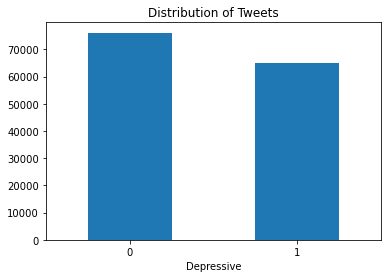

In [14]:
# Plotting the distribution for dataset.
ax = train_data.groupby("Depressive").count().plot(kind="bar", title="Distribution of Tweets", 
                                               legend=False)
ax.set_xticklabels(["0", "1"], rotation=0)

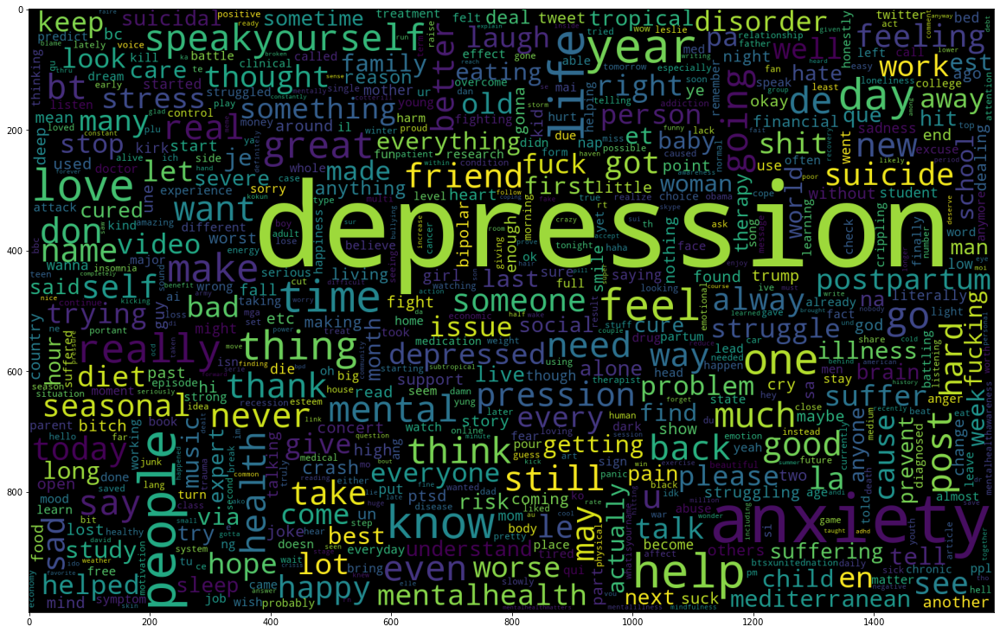

In [15]:
data_neg = train_data["Tweet"].iloc[:65058]
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 700 , width = 1600 , height = 1000,
               collocations=False).generate(" ".join(data_neg))
plt.imshow(wc)

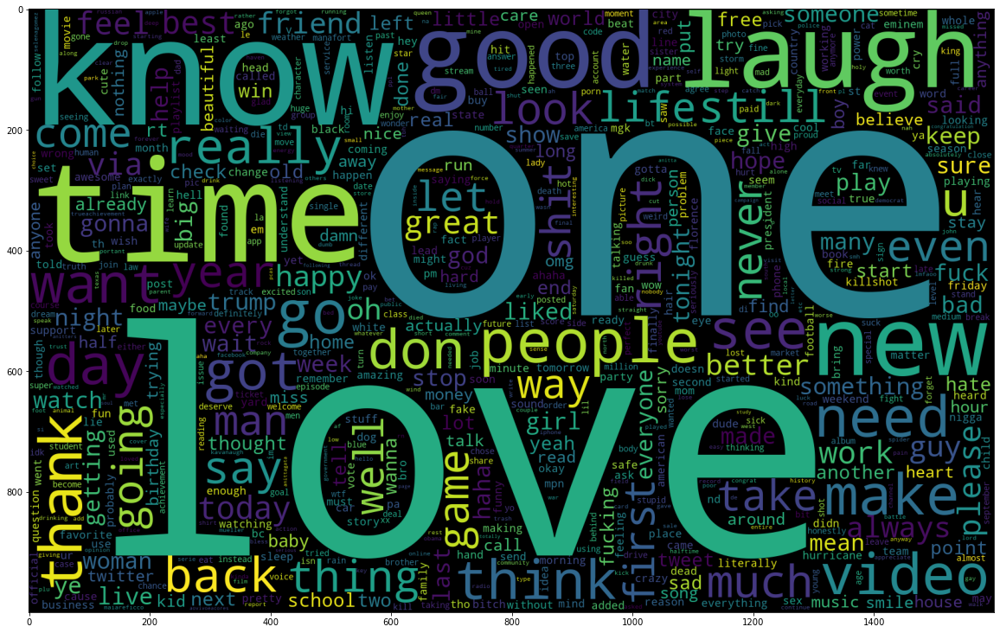

In [16]:
data_pos = train_data["Tweet"].iloc[65058:]
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 700 , width = 1600 , height = 1000,
               collocations=False).generate(" ".join(data_pos))
plt.imshow(wc)

In [17]:
train_data.to_csv("../data/Preprocessed_Training_Data.csv")

In [19]:
train_data.to_pickle("../data/Preprocessed_Data.pkl")